# Data exploration - ElemMATH2021 dataset

In this notebook we explore a few characteristics of the Squirrel AI ElemMATH2021 dataset.

In [1]:
# General imports
import sys
sys.path.append("..")

import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as metrics
from sklearn.metrics import roc_auc_score

In [2]:
# helper functions

def create_avg_histogram(df, col, cutoff=0):
    counts = df.groupby(col).size()
    avgs = df.groupby(col)['correct'].mean()[counts >= cutoff]
    
    n, bins, patches = plt.hist(avgs, 50, density=False, facecolor='g', alpha=0.75)
    plt.xlabel('Average Correctness')
    plt.ylabel('Count for ' + col)
    plt.title('Avg. Correctness: ' + col)
    plt.grid(True)
    plt.show()
    
def interactions_per_col(df, col):
    counts = df.groupby(col)["correct"].size().values
    counts = np.log2(counts)
    bins = range(20)
    
    plt.hist(counts, bins, density=False, facecolor='g', alpha=0.75)
    plt.xlim(0, 18)
    plt.xlabel('# Interactions ($\log_2$)')
    plt.ylabel('# ' + col)
    plt.title('Interactions per ' + col)
    plt.grid(True)
    plt.show()

def students_per_school(df):
    # number of students per
    counts = df.groupby('school_id')['user_id'].nunique().values
    counts = np.log2(counts)
    bins = range(20)
    
    plt.hist(counts, bins, density=False, facecolor='g', alpha=0.75)
    plt.xlim(0, 16)
    plt.xlabel('# Students ($\log_2$)')
    plt.ylabel('# Schools')
    plt.title('Students per school')
    plt.grid(True)
    plt.show()
    
def questions_per_skill(df):
    # number of questions per skill
    counts = df.groupby('skill_id')['item_id'].nunique()
    counts = counts.values
    counts = np.log2(counts)
    bins = range(20)
    
    plt.hist(counts, bins, density=False, facecolor='g', alpha=0.75)
    plt.xlim(0, 16)
    plt.xlabel('# Questions ($\log_2$)')
    plt.ylabel('# Skills')
    plt.title('Questions per skill')
    plt.grid(True)
    plt.show()
    
def scatter_avg_student_correctness_by_number_interactions(df):
    counts = df.groupby("user_id").size()
    avgs = df.groupby("user_id")['correct'].mean()
    
    plt.scatter(counts.values, avgs.values, alpha=0.07)
    plt.xlabel('# Interactions')
    plt.ylabel('Avg. Correctness')
    plt.title("Avg. Correctness / Number of Student's interactions")
    plt.grid(True)
    plt.show()

## Load data

In [3]:
data_path = "../../data/elemmath_2021/preparation/preprocessed_data.csv" 
df = pd.read_csv(data_path, sep="\t")
df.head()

,user_id,item_id,server_time,correct,skill_id,school_id,item_difficulty,s_module,app_type,course_id,teacher_id,topic_id,unix_time,date_time,timestamp
0,3,50771,399028600,0,1698,1396,70,3,2,7,3806,430,1578255355,05-Jan-2020 15:15:55,399028
1,3,39057,399047642,1,1670,1396,30,3,2,7,3806,430,1578255374,05-Jan-2020 15:16:14,399047
2,3,55337,399077257,1,1762,1396,30,3,2,7,3806,430,1578255404,05-Jan-2020 15:16:44,399077
3,3,54908,399214419,0,1678,1396,30,3,2,7,3806,430,1578255541,05-Jan-2020 15:19:01,399214
4,3,53841,399243520,0,1687,1396,30,3,2,7,3806,430,1578255570,05-Jan-2020 15:19:30,399243


In [4]:
print("# of datapoints: {}".format(len(df)))
print("# of unique users: {}".format(len(df["user_id"].drop_duplicates())))
print("# of unique items: {}".format(len(df["item_id"].drop_duplicates())))
print("# of unique skills: {}".format(len(df["skill_id"].drop_duplicates())))
print("# of unique schools: {}".format(len(df["school_id"].drop_duplicates())))
print("# of unique s_module: {}".format(len(df["s_module"].drop_duplicates())))

# of datapoints: 23408409
# of unique users: 112351
# of unique items: 59570
# of unique skills: 4035
# of unique schools: 1952
# of unique s_module: 6


In [5]:
df.isna().sum()

user_id            0
item_id            0
server_time        0
correct            0
skill_id           0
school_id          0
item_difficulty    0
s_module           0
app_type           0
course_id          0
teacher_id         0
topic_id           0
unix_time          0
date_time          0
timestamp          0
dtype: int64

## 1. What is the average number of correct responses?

In [6]:
print("Average correctness: {}".format(round(df["correct"].mean(), 4)))

ones = (np.ones(len(df["correct"])) > 0)
basic_auc = roc_auc_score(df["correct"].values > 0, ones)
print("Basic AUC value: {}".format(basic_auc, 4))

# calculate the fpr and tpr for all thresholds of the classification
#fpr, tpr, threshold = metrics.roc_curve(df["correct"].values > 0, ones)
#roc_auc = metrics.auc(fpr, tpr)
#plt.title('Receiver Operating Characteristic')
#plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
#plt.legend(loc = 'lower right')
#plt.plot([0, 1], [0, 1],'r--')
#plt.xlim([0, 1])
#plt.ylim([0, 1])
#plt.ylabel('True Positive Rate')
#plt.xlabel('False Positive Rate')
#plt.show()

Average correctness: 0.6852
Basic AUC value: 0.5


In [7]:
# All truth AUC
roc_auc_score(df["correct"].values > 0, (np.ones(len(df["correct"])) == 0))

0.5

## 2. Does s_module  effect the average correctness?

In [8]:
# Compute average correctness for each module
df_difficulty = df.groupby('s_module').agg({'correct': ['count', 'mean'], 'item_difficulty': ['mean']})
(df_difficulty)

correct           item_difficulty
             count      mean            mean
s_module                                    
1           259798  0.721056       36.438194
2         12051976  0.647972       49.891170
3          4608562  0.757909       57.935601
4          6099671  0.697713       48.049547
5           367169  0.766467       43.541203
6            21233  0.649979       43.990487

1. Pre-KP Learning: learning basic KPs which are not in current lesson "trace back", "lay the foundation"
2. Effective Learning: the main learning of KPs which are from current lesson
3. Post-test: post-test covering all KPs in current lesson with 1 question for each
4. Pre-test: pre-test covers KPs from current lesson
5. Knowledge Points Review: relearn KPs which students learned before
6. New Lesson Learning: Learning KPs based on sequence they are taught in textbook

Different modules have different average correctness.

## 3. Are difficulty label informative?

In [9]:
# Compute average correctness for each difficulty
df.groupby('item_difficulty').agg({'correct': ['count', 'mean']})

correct          
                   count      mean
item_difficulty                   
10                457663  0.793477
20                 66414  0.755488
30               8401734  0.654142
40               1948196  0.726565
50                996723  0.661544
60               1217831  0.648542
70               9837965  0.713336
80                305678  0.536139
90                176205  0.482393

This feature might help us, but we should use bins. Very low and very high difficulty values are indicative. Medium difficulties are less insightful.

## 4. How different are students from each other?

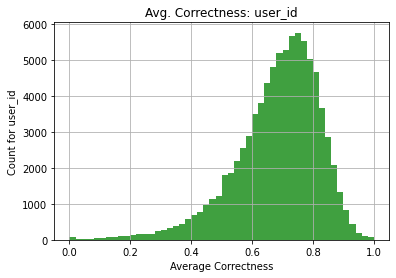

In [10]:
# Average correctness of students with at least cutoff interactions
create_avg_histogram(df, "user_id", cutoff=50)

There are strong differences between the students.

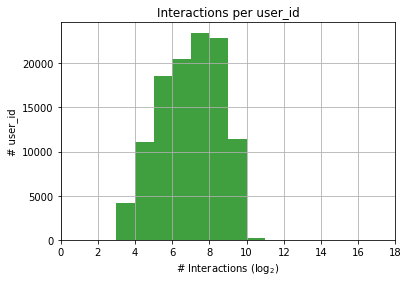

In [11]:
# Number of interactions for each student
interactions_per_col(df, "user_id")

We might want to generalize between students have only answered a small number of questions.

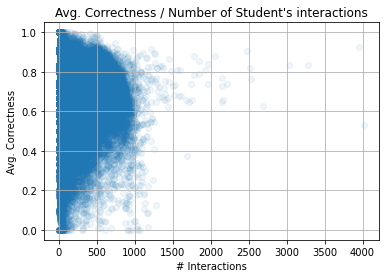

In [12]:
# Average accuracy in relationship to number of questions answered by a student
scatter_avg_student_correctness_by_number_interactions(df)

## 5. How different are Questions from each other?

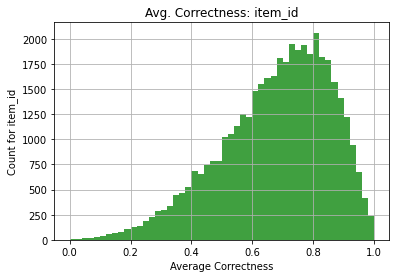

In [13]:
# Average correctness of questions with at least cutoff interactions
create_avg_histogram(df, "item_id", cutoff=20)

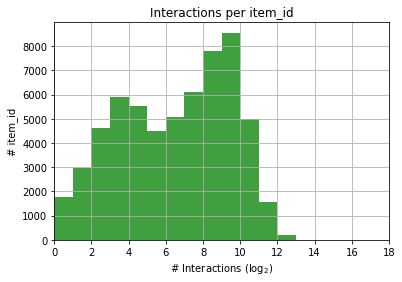

In [14]:
# Number of interactions for each question
interactions_per_col(df, "item_id")

## 6. How different are Skills from each other?

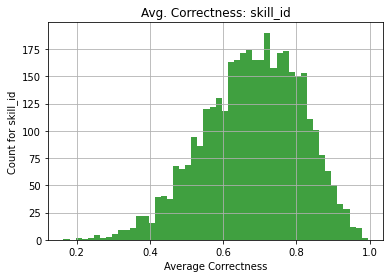

In [15]:
# Average correctness for skill with at least cutoff interactions
create_avg_histogram(df, "skill_id", cutoff=50)

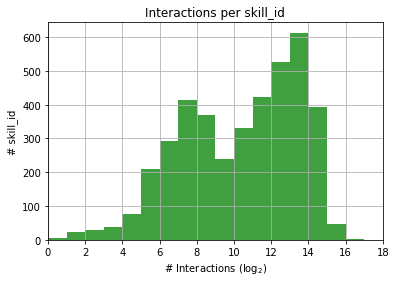

In [16]:
# Number of interactions with skill
interactions_per_col(df, "skill_id")

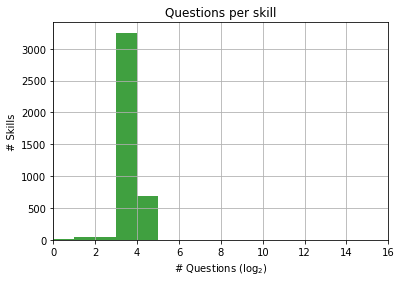

In [17]:
# Number of questions per skill
questions_per_skill(df)

It is interesting that there only few questions for each individual skill.
At most 32 questions per skill.

## 7. How different are Schools from each other?

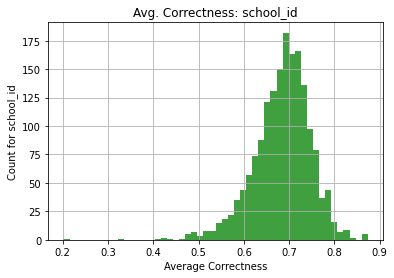

In [18]:
# Average correctness for schools with at least cutoff interactions
create_avg_histogram(df, "school_id", cutoff=500)

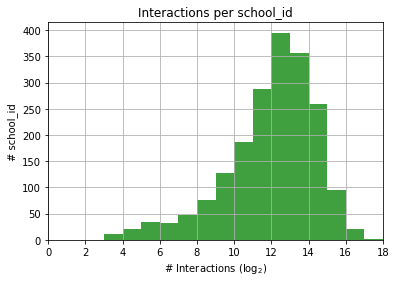

In [23]:
# Number of interactions per school
interactions_per_col(df, "school_id")

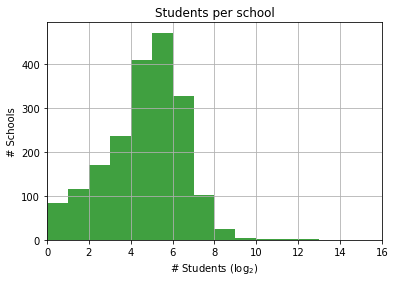

In [24]:
# Number of students by school
students_per_school(df)